# Project Segmentation & Denoising with U-Net

 * Deep Learning for Computer Vision - Winter Term 2024/25
 * Lecture by: Constantin Pape
 * Tutors: Anwai Archit, Oleg Bakumenko, Luca Freckmann, Marei Freitag, Sarah Muth, Sushmita Nair
 * Due date: **Tuesday**, Dec 17, before 10:00

In this assignment we will use a U-Net for two different tasks:
- semantic segmentation of nuclei in microscopy images
- denoising of natural images

## Hints
The goal of the first part of the exercise (segmentation) is to implement the U-Net architecture very similar to the original publication and then use it for its initial purpose, semantic segmentation. In the second part we will use the same U-Net implementation, but use it for a different task: denoising, following the ideas of noise-to-noise.

To understand the background of this exercise you can:

* Review the lecture (Lecture 5 for U-Net architecture, Lecture 6 for noise-to-noise)
* Read the [U-Net publication](https://arxiv.org/abs/1505.04597).
* Read the [noise-to-noise publication](https://arxiv.org/abs/1803.04189).
* This Exercise consists of 2 parts, make sure to read it till the end

Note that we will implement the same ideas as in these papers, but will deviate from the implementation details and conduct different and fewer experiments.

*Do not hesitate to ask questions and ideally discuss them with the fellow students on Rocket Chat! We will monitor the channel to provide you help if your discussions get stuck.*

### IMPORTANT SUBMISSION INSTRUCTIONS
- **You need to answer all the questions in written form**
- When you're done, download the notebook from Kaggle and **rename** it to `<surname1>_<surname2>_<surname3>.ipynb`
- Only submit the Jupyter Notebook (ipynb file). No other file is required. Upload it on `Stud.IP` -> `Deep Learning for Computer Vision` -> `Files` -> `Submission for Homework 4` -> `Tutorial <X>`, (where, `X` is the tutorial you are assigned to).
- Make only one submission of the exercise per group.
- The deadline is strict
- You have to present the exercise in the tutorials. We have a high ratio of students to tutors, so please decide which team member presents which part beforehand.

Implementation
- Only change code to replace placeholders. Leave the other code as is. In addition to the python packages loaded below you are allowed to use any packages you want.

**Import required libraries.**

In [ ]:
import os
import tqdm
import zipfile
import requests
from glob import glob
from pathlib import Path

import numpy as np
import seaborn as sns
import imageio.v3 as imageio
from matplotlib import colors
import matplotlib.pyplot as plt

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from skimage.measure import label
from skimage.util import random_noise
from scipy.optimize import linear_sum_assignment
from skimage.segmentation import find_boundaries, watershed
from skimage.metrics import contingency_table, peak_signal_noise_ratio

In [ ]:
# Create a root folder where to save the data for this exercise in Kaggle
root_folder = "/kaggle/working/dlforcv-ex4"
os.makedirs(root_folder, exist_ok=True)

In [ ]:
!pip install torchsummary
from torchsummary import summary

## Segmentation
In the first part of the exercise we will implement the U-Net architecture and apply it to segment nuclei in fluorescence microscopy images. This is an important task in microscopy image analysis in order to identify and characterize cell morphology and dynamics. The data we are using is a subset of the [Kaggle Nucleus Segmentation challenge](https://www.kaggle.com/c/data-science-bowl-2018).

### Data preparation

In [ ]:
# Download the data
data_folder = os.path.join(root_folder, "kaggle-data")
url = "https://github.com/stardist/stardist/releases/download/0.1.0/dsb2018.zip"
if not os.path.exists(data_folder):
    os.makedirs(data_folder)
    tmp_path = os.path.join(data_folder, "data.zip")
    with requests.get(url) as r:
        with open(tmp_path, "wb") as f:
            f.write(r.content)

    with zipfile.ZipFile(tmp_path, "r") as f:
        f.extractall(data_folder)

    os.remove(tmp_path)

data_folder = os.path.join(data_folder, "dsb2018")
assert os.path.exists(data_folder)

**Data exploration**

The data is stored in the root folder `dsb2018` and contains the two subfolders `train` and `test` with train/test split. Each of these folders contains the folders `images` with the raw image data and `masks` with the instance masks. As a first step, we will visualize some of the images and labels from the training data.

In [ ]:
image_paths = glob(os.path.join(data_folder, "train", "images", "*.tif"))
image_paths.sort()

mask_paths = glob(os.path.join(data_folder, "train", "masks", "*.tif"))
mask_paths.sort()

assert len(image_paths) == len(mask_paths)

In [ ]:
# Function to generate a random color map for a label image
def get_random_colors(labels):
    n_labels = len(np.unique(labels)) - 1
    cmap = [[0, 0, 0]] + np.random.rand(n_labels, 3).tolist()
    cmap = colors.ListedColormap(cmap)
    return cmap

In [ ]:
def plot_sample(image_path, mask_path):
    image, mask = imageio.imread(image_path), imageio.imread(mask_path)
    fig, ax = plt.subplots(1, 2)

    ax[0].axis("off")
    ax[0].imshow(image, cmap="gray")

    # Visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
    plt.show()

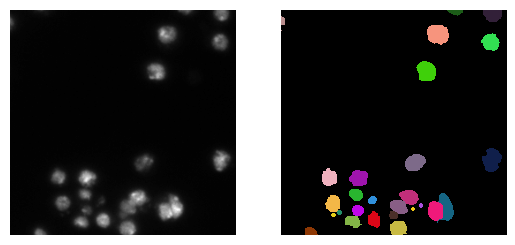

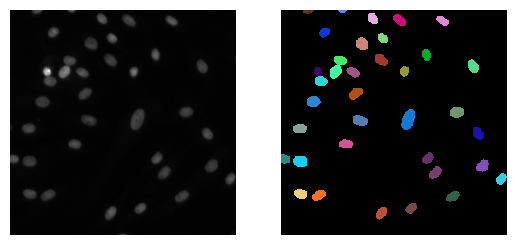

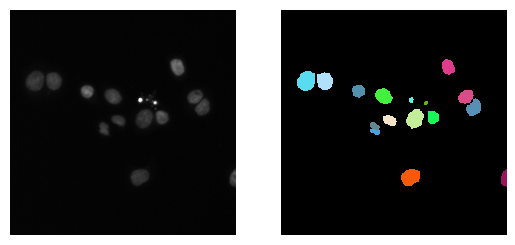

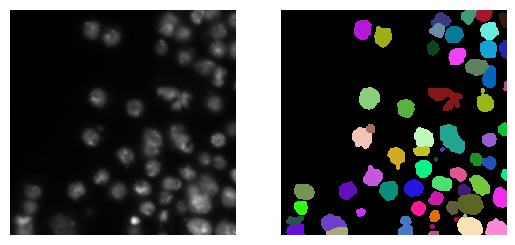

In [ ]:
# Plot the first 4 images
for i in range(4):
    plot_sample(image_paths[i], mask_paths[i])

You should see 4 images with nuclei and the corresponding colored nuclei masks. To further understand and explain the data, please answer the following **QUESTIONS**:
- Do the ids assigned to the individual nuclei (= colors in the 2nd image column) have a fixed meaning? In other words, would the segmentation meaningfully change if we change shuffle the ids, so that all pixels labeled `1` are labeled `2` and so on?
- Can we directly use a U-Net to predict the mask ids? Why / Why not?

**Answer**
*  No, the IDs assigned to the nuclei (colors in the mask image) are arbitrary using `get_random_colors(mask)` and do not have a fixed meaning. Hence, the meaning of these colors vary in each image. They are unique only within a specific image, serving to distinguish one nucleus from another. Shuffling the IDs (e.g., swapping all pixels labeled `1` with those labeled `2`) does not change the segmentation's interpretation or utility, as the IDs are only relative.

*  No, we cannot directly use a U-Net to predict the mask IDs. The reason is that the U-Net architecture is designed for semantic segmentation, where the focus is on predicting class probabilities for each pixel (e.g., nucleus vs. background) rather than assigning unique instance IDs. Predicting unique IDs for individual nuclei would require additional steps, such as post-processing techniques like connected components, watershed segmentation, or instance segmentation methods that treat each nucleus as a distinct object.

In [ ]:
# TODO find how many images we have in the training set
# and find all (unique) shapes of the images in the training set
import random
size_train = len(image_paths)

print("Number of images in the traning set:", size_train)

shape_images = []
for i in range(size_train):
    image = imageio.imread(image_paths[i])
    shape_images.append(image.shape)
# print(shape_images)
shape_images = np.array(shape_images)
unique_shapes = np.unique(shape_images, axis=0)

print("Unique shapes in the traning set: ", unique_shapes)

Number of images in the traning set: 447
Unique shapes in the traning set:  [[256 256]
 [256 320]
 [260 347]
 [360 360]
 [512 640]
 [520 696]]


**QUESTIONS**:
- Do all images have the same shape? If not, can this lead to problems?
- How could we deal with potential problems due to different image shapes?

**Answer**

*   No, the images do not all have the same shape. This can lead to problems because deep learning models like U-Net require consistent input dimensions to process images in batches. Mismatched shapes can result in errors during training or inference, particularly when trying to concatenate feature maps or assemble images into a batch for processing.

*  To address the issue of varying shapes, the following strategies can be applied:
     - **Resizing/Rescaling:** Normalize all images to a fixed size (e.g., 256x256) using interpolation methods like bilinear or bicubic resizing. However, this may introduce distortion if the aspect ratios differ.
     - **Cropping/Padding:** Crop images to a fixed size if they are larger or pad smaller images with zeros (or reflective padding) to achieve consistent dimensions while preserving aspect ratios.
     - **Patch-based Training:** Use patches of a fixed size (e.g., 256x256) extracted from larger images for training. This avoids resizing and allows for training on high-resolution data.
     - **Dynamic Batching:** Handle varying image sizes individually during training (though this can be computationally less efficient).

In [ ]:
# TODO now load the images and masks into memory, and normalize the images so that they have zero mean and unit variance
images = []
for path in image_paths:
    image = imageio.imread(path)
    images.append(image)

masks = []
for path in mask_paths:
    masks.append(imageio.imread(path))

In [ ]:
ims_flat = np.concatenate([im.ravel() for im in images])
mean, std = np.mean(ims_flat), np.std(ims_flat)
images = [(im.astype("float32") - mean) / std for im in images]


print(mean, std)

14.423265754858166 19.57161020949301


In [ ]:
# TODO make a train validation split, use every 20th image for validation
i = 20
tmpimages = images
del tmpimages[i-1::i]

tmpmasks = masks
del tmpmasks[i-1::i]

train_images = tmpimages
train_masks = tmpmasks
val_images = images[i-1::i]
val_masks = masks[i-1::i]

del tmpimages,tmpmasks

In [ ]:
val_masks[10]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [ ]:
# Finally, let's choose the appropriate torch device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

**Implement PyTorch dataset**

As a next step, we implement a `torch.utils.data.Dataset` to access the data for training. As you should have realized in the previous question, the images in our training set come in different sizes. But in order to assemble images into batches we need images of the same size. To solve this issue, we will subsample patches of size 256 x 256 (smallest image size) from the images in the dataset.

In [ ]:
class NucleiDataset(Dataset):
    def __init__(self, images, masks, image_transform=None, mask_transform=None, transform=None):
        assert len(images) == len(masks)
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.transform = transform

    def __getitem__(self, index):
        image, mask = self.images[index], self.masks[index]

        # Crop the images to have the shape 256 x 256, so that we can feed them into memory
        # despite them having different sizes
        crop_shape = (256, 256)
        shape = image.shape
        if shape != crop_shape:
            assert image.ndim == mask.ndim == 2
            crop_start = [np.random.randint(0, sh - csh) if sh != csh else 0 for sh, csh in zip(shape, crop_shape)]
            crop = tuple(slice(cs, cs + csh) for cs, csh in zip(crop_start, crop_shape))
            image, mask = image[crop], mask[crop]

        # Apply the transforms if given
        if self.image_transform is not None:
            image = self.image_transform(image)

        if self.mask_transform is not None:
            mask = self.mask_transform(mask)

        if self.transform is not None:
            image, mask = self.transform(image, mask)

        # Make sure we have numpy arrays and add a channel dimension for the image data
        image, mask = np.array(image), np.array(mask)
        if image.ndim == 2:
            image = image[None]

        return image, mask

    def __len__(self):
        return len(self.images)

As discussed in the lecture, we can't learn the instance segmentation directly. So we will first start with a semantic segmentation problem and train the U-Net to distinguish foreground (nucleus) from background pixels. In other words, the network should predict for each pixel whether it belongs to a nucleus or to the background. To this end, implement a `mask_transform` that converts the instance segmentation ground-truth into a binary target and pass it to the training dataset.

In [ ]:
# TODO implement a transform that outputs the binary target
# and instantiate the training dataset and validation dataset with it
# HINT: the transform can be a function that takes the mask array as input and returns the binarized version
# HINT: you will also need to add a channel dimension to the target
# HINT: the targets need to be "float32" values (for the BCE Loss coming ahead)

def binary_transform(mask):
    mask_binary = (mask != 0).astype(np.float32)
    return np.expand_dims(mask_binary,0)

train_dataset = NucleiDataset(train_images, train_masks, image_transform=None, mask_transform=binary_transform, transform=None)
val_dataset =  NucleiDataset(val_images, val_masks, image_transform=None, mask_transform=binary_transform, transform=None)

# train_dataset = NucleiDataset(train_images, train_masks)
# val_dataset =  NucleiDataset(val_images, val_masks)


# print(val_masks[10])
# print(preprocess_mask(val_masks[10]))

(1, 256, 256) (1, 256, 256)


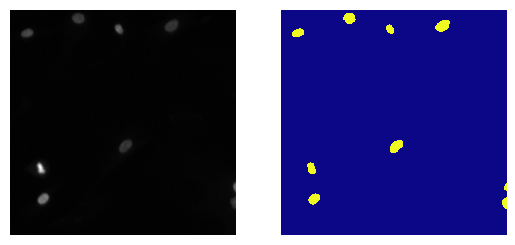

(1, 256, 256) (1, 256, 256)


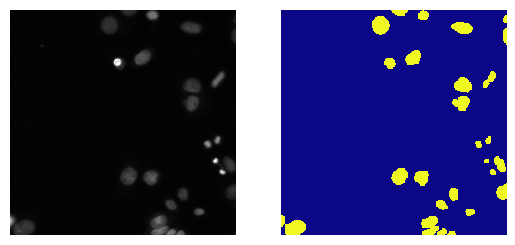

In [ ]:
# TODO sample a few images from the dataset and verify that they are correct
def plot_sample2(image, mask):
    fig, ax = plt.subplots(1, 2)
    ax[0].axis("off")
    ax[0].imshow(image, cmap="gray")
    # visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask, cmap=plt.cm.plasma, interpolation="nearest")
    plt.show()

for i in np.random.randint(len(train_dataset), size=2):
    im, msk = train_dataset[i]
    print(im.shape, msk.shape)
    plot_sample2(im[0], msk[0])

The images you sample should look similar to this (using the standard colormap for the binarized mask):

![image.png](attachment:7a3c7378-f318-4251-a249-f50e519418cc.png)

### Implement the U-Net

Next, we will implement a U-Net architecture inspired [Ronneberger et al.](https://arxiv.org/abs/1505.04597), see the image below.

IMPORTANT: unlike in the publication / image we will use SAME convolutions, so that the input shape is the same as the output shape. This will introduce some boundary artifacts, but it will make implementing the rest of this exercise much simpler.

It also means that you don't need to crop the features passed on in the skip connections and can directly concatenate them.

![image.png](attachment:7f50d51a-e616-4666-b42d-12d43ff07ef7.png)

HINTS:
- the `up-conv` used here is called [ConvTranspose2d](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html#convtranspose2d) in PyTorch.
- you can concatenate the features coming from the skip connections and the encoder with `torch.cat`
- you will need `nn.ModuleList` to store the individual blocks of the encoder / decoder

Before you implement the U-Net, please answer the following QUESTIONS:
- What kind of architecture is the U-Net and what is the rationale behind this architecture?
- What other types of architectures for semantic segmentation exist to achieve similar effects?
- Why are the skip connections used in the U-Net?

**Answers**

*  U-Net is an encoder-decoder architecture with skip connections. The encoder extracts features and reduces spatial resolution, while the decoder upsamples and reconstructs the segmentation map. Skip connections combine context from the encoder with spatial details, creating a symmetric U-shaped design.



*  Alternatives include Fully Convolutional Networks (FCN), DeepLab, and Hierarchical Multi-Scale Attention networks, which also focus on capturing context and spatial details for segmentation.



*   Skip connections address information loss during down-sampling by merging low-level spatial features from the encoder with high-level features in the decoder, enhancing boundary and detail preservation.

In [ ]:
class Downsampling(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Downsampling, self).__init__()

        # Define the layers in a sequential fashion
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
        )

    def forward(self, x):
        # Apply the defined layers to the input
        return self.layers(x)

In [ ]:
class Upsampling(nn.Module):
    def __init__(self, in_channels, mid_channels, out_channels):
        super(Upsampling, self).__init__()

        # Define the layers in a sequential fashion
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=mid_channels, kernel_size=3, padding="same"),
            nn.ReLU(),
            nn.Conv2d(in_channels=mid_channels, out_channels=mid_channels, kernel_size=3, padding="same"),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=mid_channels, out_channels=out_channels, kernel_size=2, stride=2),
        )

    def forward(self, x):
        # Apply the defined layers to the input
        return self.layers(x)

In [ ]:
def copy_crop(xenc, xdec):
    (_, _, Hdec, Wdec) = xdec.shape
    xenc = torchvision.transforms.CenterCrop([Hdec, Wdec])(xenc)
    return xenc

In [ ]:
class UNet2(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet2, self).__init__()

        # Encoder
        self.encoder = nn.ModuleList([
            self.conv_block(in_channels, 64),
            self.conv_block(64, 128),
            self.conv_block(128, 256),
            self.conv_block(256, 512),
            self.conv_block(512, 1024),
        ])

        # Decoder
        self.decoder = nn.ModuleList([
            self.uconv_block(1024, 512),
            self.uconv_block(512, 256),
            self.uconv_block(256, 128),
            self.uconv_block(128, 64),
            self.uconv_block(64, out_channels),
        ])

        self.upconv = nn.ModuleList([
            nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2),
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
        ])

        # Up-convolution layer
        self.pool = nn.MaxPool2d(kernel_size=2)
        self.final=nn.Conv2d(64,out_channels,kernel_size=1)

    def conv_block(self, in_channels, out_channels):
          return nn.Sequential(
              nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
              nn.ReLU(),
              nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
              nn.ReLU(),
          )


    def uconv_block(self, in_channels, out_channels):
          return nn.Sequential(
              nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
              nn.ReLU(),
              nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
              nn.ReLU(),
          )


    def forward(self, x):
        # Encoder
        encoder_features = []
        for block in self.encoder[:-1]:
            x = block(x)
            encoder_features.append(x)
            x=self.pool(x)
        x = self.encoder[-1](x)
        # Decoder
        for upconv, block, encoder_feature in zip(self.upconv, self.decoder, reversed(encoder_features)):
            x = upconv(x)
            x = torch.cat([x, encoder_feature], dim=1)
            x = block(x)
        x = self.final(x)
        return x

In [ ]:
model2 = UNet2().to(device)
summary(model2, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]             640
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

In [ ]:
# TODO implement the U-Net architecture
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()
        self.dblk1 = Downsampling(in_channels=in_channels, out_channels=64) #1->64
        self.dblk2 = Downsampling(in_channels=64, out_channels=2*64) #64->128
        self.dblk3 = Downsampling(in_channels=2*64, out_channels=4*64) #128->256
        self.dblk4 = Downsampling(in_channels=4*64, out_channels=8*64) #256->512
        self.bneck = Downsampling(in_channels=8*64, out_channels=16*64) #512->1024
        self.convtr = nn.ConvTranspose2d(in_channels=16*64, out_channels=8*64, kernel_size=2, stride=2)
        self.ublk4 = Upsampling(in_channels=16*64, mid_channels=8*64, out_channels=4*64)#1024->512->256
        self.ublk3 = Upsampling(in_channels=8*64, mid_channels=4*64, out_channels=2*64) #512->256->128
        self.ublk2 = Upsampling(in_channels=4*64, mid_channels=2*64, out_channels=1*64) #256->128->64
        self.ublk1 = Upsampling(in_channels=2*64, mid_channels=1*64, out_channels=1*64) #128->64
        self.ulast = nn.Conv2d(in_channels=64, out_channels=out_channels, kernel_size=(1, 1))


    def forward(self, x):
        x1 = self.dblk1(x) #64
        x2 = self.dblk2(x1) #128
        x3 = self.dblk3(x2) #256
        x4 = self.dblk4(x3) #512
        x5 = self.bneck(x4) #1024
        x6 = self.convtr(x5)
        x4new = copy_crop(x4, x6)
        x06 = torch.cat((x4new,x6), dim=1)
        x7 =  self.ublk4(x06)
        x3new = copy_crop(x3, x7)
        x07 = torch.cat((x3new,x7), dim=1)
        x8 =  self.ublk3(x07)
        x2new = copy_crop(x2, x8)
        x08 = torch.cat((x2new,x8), dim=1)
        x9 =  self.ublk2(x08)
        x1new = copy_crop(x1, x9)
        x09 = torch.cat((x1new,x9), dim=1)
        x10 =  self.ublk1(x09)
        x11 = self.ulast(x10)

#         x11,_ = torch.max(x11, 1, keepdim=False)
        return x11

In [ ]:
# TODO instantiate a unet and check that your architecture is correct by applying it to
# an input from the train loader

model = UNet().to(device)
summary(model, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]             640
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
      Downsampling-6         [-1, 64, 128, 128]               0
            Conv2d-7        [-1, 128, 128, 128]          73,856
              ReLU-8        [-1, 128, 128, 128]               0
            Conv2d-9        [-1, 128, 128, 128]         147,584
             ReLU-10        [-1, 128, 128, 128]               0
        MaxPool2d-11          [-1, 128, 64, 64]               0
     Downsampling-12          [-1, 128, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         295,168
             ReLU-14          [-1, 256,

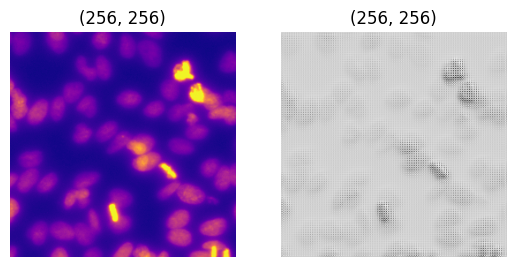

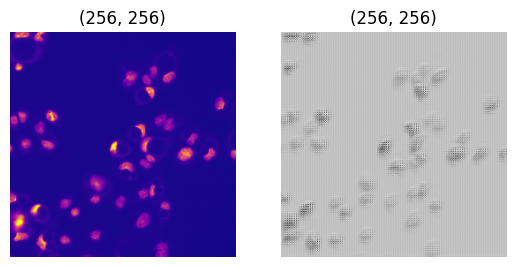

In [ ]:
# TODO display the prediction. Can you interpret the resulting image?

for i in np.random.randint(len(train_dataset), size=2):
    im, msk = train_dataset[i]
    pred = model(torch.from_numpy(np.array([im])).to(device))
    fig, ax = plt.subplots(1, 2)
    ax[0].axis("off")
    ax[0].imshow(im[0], cmap=plt.cm.plasma)
    ax[0].set_title(im[0].shape)
    ax[1].axis("off")
    ax[1].imshow(pred[0].cpu().detach().numpy()[0], cmap='Greys')
    ax[1].set_title(pred[0].cpu().detach().numpy()[0].shape)
    plt.show

## Training
Now we can define the training functions, similar to the last exercises but adapted for segmentation, and then plot the results of loss and metrics.

## Discussion:
Another way to monitor the loss, metrics and images during training and validation is [tensorboard](https://www.tensorflow.org/tensorboard). Note that usually the data for tensorboard is stored separately from the notebook files/scripts, so if you copy the scripts somewhere else you will not see the curves in tensorboard anymore.

In [ ]:
# In this cell all the training and validation functions are implemented for you already;
# these implementations are fairly similar to the exercise where we trained a CNN on CIFAR

# Normalize a tensor to range [0, 1] (per channel).
# This is needed to properly display the tensor as an image.
def normalize(tensor):
    eps = 1e-6
    normed = tensor.numpy()
    minval = normed.min(axis=(0, 2, 3), keepdims=True)
    normed = normed - minval
    maxval = normed.max(axis=(0, 2, 3), keepdims=True)
    normed = normed / (maxval + eps)
    return torch.from_numpy(normed)


# Train the model for one epoch
def train_epoch(model, loader, loss, metric, optimizer):
    model.train()
    metric_list, loss_list = [], []
    for i, (x, y) in enumerate(loader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        pred = model(x)
        loss_value = loss(pred, y)
        loss_value.backward()
        optimizer.step()
        loss_list.append(loss_value.item())
        if metric is not None:
            metric_value = metric(pred, y)
            metric_list.append(metric_value.item())

    if metric is not None:
        return np.mean(loss_list), np.mean(metric_list)
    else:
        return np.mean(loss_list), None


# Validate the model
def validate(model, loader, loss, metric):
    model.eval()
    metric_list, loss_list = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x)
            loss_value = loss(pred, y).item()
            loss_list.append(loss_value)
            if metric is not None:
                metric_value = metric(pred, y).item()
                metric_list.append(metric_value)

    if metric is not None:
        return np.mean(loss_list), np.mean(metric_list)
    else:
        return np.mean(loss_list), None


# Run the whole training
def run_training(
    model, train_loader, val_loader, loss, metric, optimizer, n_epochs
):
    train_losses, train_accs = [], []
    val_losses, val_accs = [], []
    for epoch in tqdm.trange(n_epochs):
        epoch_train_loss, epoch_train_acc = train_epoch(model, train_loader, loss, metric, optimizer)
        epoch_val_loss, epoch_val_acc = validate(model, val_loader, loss, metric)

        # Save the loss and accuracy for plotting
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)
        val_losses.append(epoch_val_loss)
        val_accs.append(epoch_val_acc)

    return train_losses, train_accs, val_losses, val_accs


# Plot the metrics
def plot(
    title, label, train_results, val_results, yscale='linear', save_path=None, extra_pt=None, extra_pt_label=None
):
    epoch_array = np.arange(len(train_results)) + 1
    train_label, val_label = "Training " + label.lower(), "Validation " + label.lower()

    sns.set(style='ticks')

    plt.plot(epoch_array, train_results, epoch_array, val_results, linestyle='dashed', marker='o')
    legend = ['Train results', 'Validation results']

    if extra_pt:
        plt.plot(*extra_pt, 'ok')

    if extra_pt_label:
        legend.append(extra_pt_label)

    plt.legend(legend)
    plt.xlabel('Epoch')
    plt.ylabel(label)
    plt.yscale(yscale)
    plt.title(title)

    sns.despine(trim=True, offset=5)
    plt.title(title, fontsize=15)
    if save_path:
        plt.savefig(str(save_path), bbox_inches='tight')

    plt.show()

We will use (per-pixel) binary cross entropy as a loss function. Pytorch offers to different implementations of this loss: [BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html) and [BCEWithLogitsLoss](https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html).

HINTS:
- The targets for BCE should be 'float32' values

QUESTIONS:
- What is the difference between the two different implementations?
- Which one do we need to use here, and why?

**Answers**


* BCELoss: Requires the model's output to be probabilities in the range \([0, 1]\), which means a **sigmoid activation** must be applied to the output before passing it to the loss function.
BCEWithLogitsLoss: Combines the sigmoid activation and the binary cross-entropy calculation in a single step. This makes it more **numerically stable**, avoiding potential issues with very small or large outputs that can cause numerical overflow or underflow.


*  We should use **BCEWithLogitsLoss** because it is more **numerically stable** and does not require applying the sigmoid activation separately in the model's forward pass. This simplifies implementation and reduces the risk of errors.


In [ ]:
# TODO create the loss function
loss = nn.BCEWithLogitsLoss()

Next, we want to define a suitable metric for measuring the quality of the (binary) network prediction. We will use the [dice score](https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient) for this, which compares the intersection of prediction and target to their union.

In [ ]:
# TODO implement the dice score as a function.
# HINTS:
# - for later parts of this exercises, you should implement it in such a way that
# the function can compute the dice score for input and target with multiple channels,
# and so that it is computed independently per channel and the channel average is returned
# - since we don't have an activation in the U-Net you need to bring the predictions in range [0, 1] using torch.sigmoid
# - the dice score can be formulated for continuous predictions in [0, 1]; you do not need to threshold the predictions


def dice_score(input_, target):

    _,channels,_,_ =input_.shape

    dice = 0
    intersection = torch.sum(input_ * target, axis=(0, 2, 3))
    denom = torch.sum(input_ , axis=(0, 2, 3)) + torch.sum(target, axis=(0, 2, 3))
    dice = (intersection*2.0 / denom).sum()

    return dice #sum over batch axis

In [ ]:
# TODO check your dice implementation for an example model prediction and the corresponding target
for i in np.random.randint(len(train_dataset), size=2):
    im, msk = train_dataset[i]
    crop = torch.from_numpy(np.array([im])).to(device)
    pred = model(torch.from_numpy(np.array([im])).to(device))
    dice_coeff = dice_score(crop, pred)
    print(dice_coeff)

tensor(-0.0113, device='cuda:0', grad_fn=<SumBackward0>)
tensor(-0.0270, device='cuda:0', grad_fn=<SumBackward0>)


100%|██████████| 10/10 [03:08<00:00, 18.82s/it]


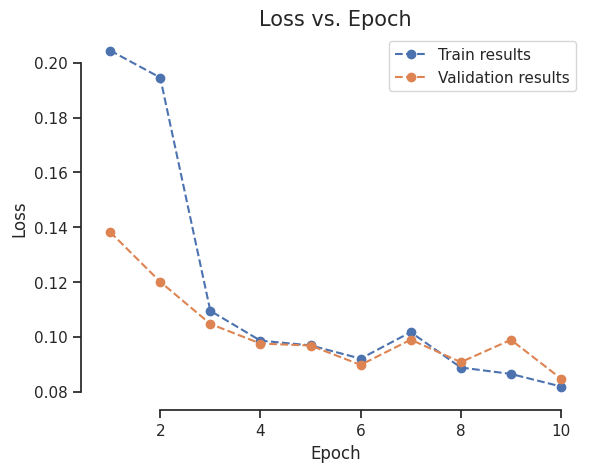

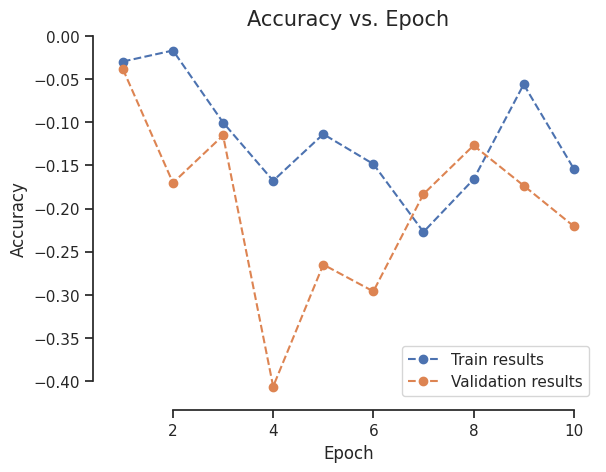

In [ ]:
# Train the model for 10 epochs,
# after the training, check the plots to see how the model loss and metrics evolve,
# and to see predictions of the training data in real time
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = dice_score
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

100%|██████████| 10/10 [04:44<00:00, 28.47s/it]


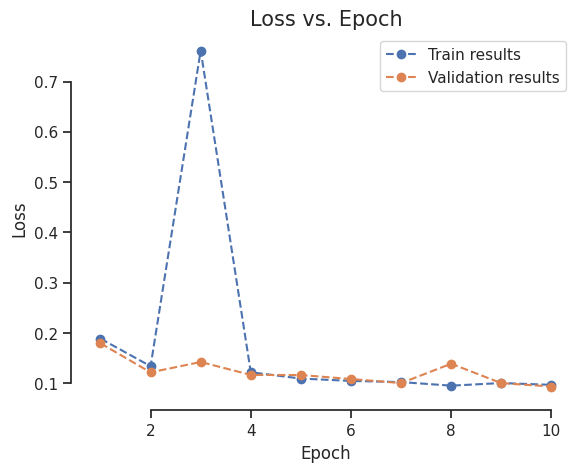

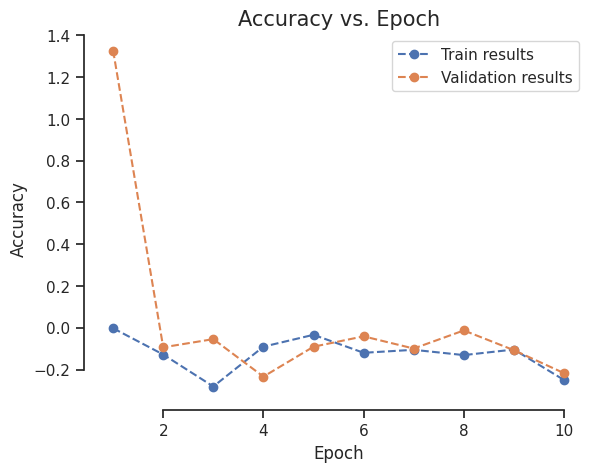

In [ ]:
# model2
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model2.parameters(), lr=1e-3)
metric = dice_score
train_losses, train_accs, val_losses, val_accs = run_training(model2, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

## Evaluate on test data

Now, we will evaluate the **instance segmentation**  derived from the model predictions on the test data. To this end, we will use [connected components](https://en.wikipedia.org/wiki/Component_(graph_theory)#Algorithms) to convert the (binarized) network predictions into an instance segmentation. We will use the implementation from [skimage](https://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.label).

**QUESTION**:
- Describe briefly what the connected components algorithm does when applied to a (binary) image. (You don't need to comment on the implementation).

**Answer :**

The connected components algorithm identifies groups of neighboring pixels in a binary image that share the same value (e.g., `1` for foreground). It treats these groups as connected regions or components. The algorithm assigns a unique label to each connected region, effectively segmenting the image into distinct objects. Pixels are considered connected based on a specified connectivity, such as 4-connectivity (sharing edges) or 8-connectivity (sharing edges or corners).

In [ ]:
# TODO Load and normalize the test images
timagep = glob(os.path.join(data_folder, "test", "images", "*.tif"))
timagep.sort()
tmasksp = glob(os.path.join(data_folder, "test", "masks", "*.tif"))
tmasksp.sort()

test_images =[imageio.imread(i) for i in timagep]
test_masks =[imageio.imread(i) for i in tmasksp]

ims_flat = np.concatenate([im.ravel() for im in test_images])
mean, std = np.mean(ims_flat), np.std(ims_flat)
test_images = [(im.astype("float32") - mean) / std for im in test_images]

test_dataset = NucleiDataset(test_images, test_masks, image_transform=None, mask_transform=binary_transform, transform=None)


# test_images = []
# test_masks = []
# for i in np.arange(len(train_dataset)):
#     im, msk = train_dataset[i]
#     test_images.append(im)
#     test_masks.append(msk)

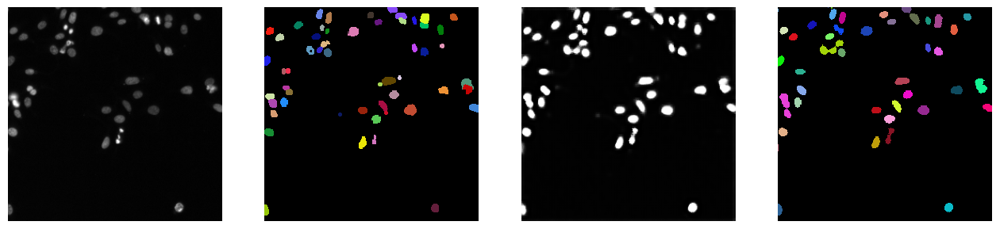

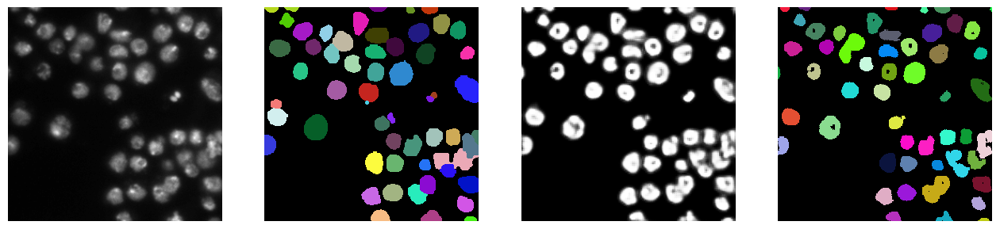

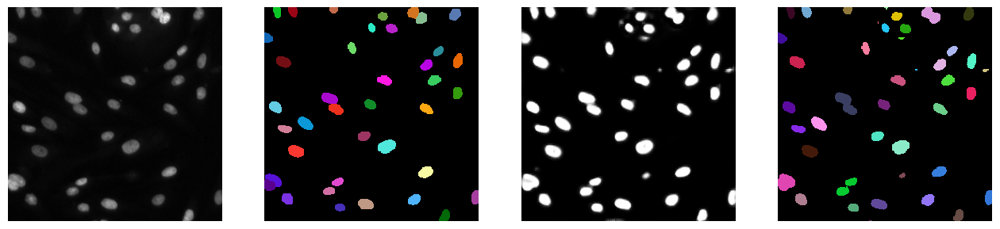

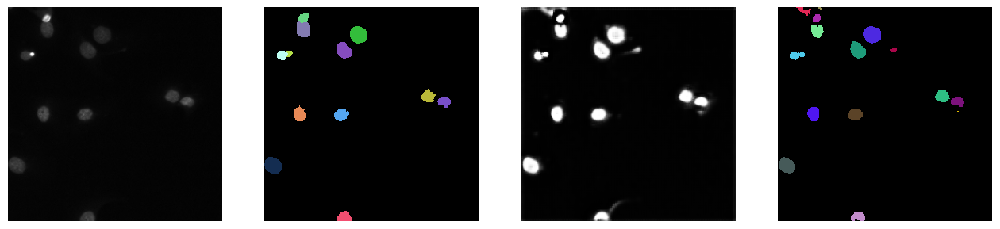

In [ ]:
# Check out instance segmentation for a few test images
counter = 0
with torch.no_grad():
    for im, mask in zip(test_images, test_masks):
        if counter > 3:
            break

        # Predict with the model and apply sigmoid to map the prediction to the range [0, 1]
        pred = model(torch.from_numpy(im[None, None]).to(device))
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()

        # Get tbe nucleus instance segmentation by applying connected components to the binarized prediction
        nuclei = label(pred > 0.5)
        fig, ax = plt.subplots(1, 4, figsize=(16, 16))

        ax[0].axis("off")
        ax[0].imshow(im, cmap="gray")

        ax[1].axis("off")
        ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")

        ax[2].axis("off")
        ax[2].imshow(pred, cmap="gray")

        ax[3].axis("off")
        ax[3].imshow(nuclei, cmap=get_random_colors(nuclei), interpolation="nearest")

        plt.show()

        counter += 1

To measure the segmentation quality we compute the intersection over union of each object in the prediction and each object in the ground-truth (if they overlap at all). We then find the best match between ground-truth and predicted objects and count all best matches above a given threshold (here 0.5) as true positives (TP). The objects in the the ground-truth that do not have a match are counted as false negatives (FN), the objects in the prediction that do not have a match as false positives (FP).

We can then compute the F1-Score based on TP, FP and FN and use it as evaluation criterion to compare the quality of instance segmentation results.
For segmentation, a good F1-score is typically above 0.9 for clean datasets, though 0.7–0.8 may suffice for challenging cases.

In [ ]:
# Compute f1 score based on true positives, false positives and false negatives
def f1(tp, fp, fn):
    return (2*tp)/(2*tp+fp+fn) if tp > 0 else 0


# Compute the matches between predicted object (seg) and ground-truth objects (mask)
def compute_scores(seg, mask):
    # The contingency table function computes the overlap (intersection) between all objects in the two segmentations
    overlap = contingency_table(seg, mask).toarray()

    # Compute the total number of pixels for each object
    n_pixels_pred = np.sum(overlap, axis=0, keepdims=True)
    n_pixels_true = np.sum(overlap, axis=1, keepdims=True)

    # Normalize the overlap by the union to compute the IOU
    eps = 1e-7
    ious = overlap / np.maximum(n_pixels_pred + n_pixels_true - overlap, eps)

    # Ignore matches with zero (= background)
    ious = ious[1:, 1:]

    # Compute the number of true objects (in mask), predicted object (in seg)
    # and the maximal number of matches (minimum of the too)
    n_pred, n_true = ious.shape
    n_matched = min(n_pred, n_true)
    return n_true, n_matched, n_pred, ious


# Compute the true positives (= matches with a iou bigger than the threshold)
def compute_tps(ious, n_matched, threshold):
    not_trivial = n_matched > 0 and np.any(ious >= threshold)
    if not_trivial:
        # Compute optimal matching with iou scores as tie-breaker
        costs = -(ious >= threshold).astype(float) - ious / (2*n_matched)
        pred_ind, true_ind = linear_sum_assignment(costs)
        assert n_matched == len(true_ind) == len(pred_ind)
        match_ok = ious[pred_ind, true_ind] >= threshold
        tp = np.count_nonzero(match_ok)
    else:
        tp = 0

    return tp


# Compute the f1 score between predicted (seg) and ground-truth (mask) objects for the given threshold
def f1_score(seg, mask, threshold=0.5):
    if seg.sum() == 0:
        return 0.0

    n_true, n_matched, n_pred, scores = compute_scores(seg, mask)
    tp = compute_tps(scores, n_matched, threshold)
    fp = n_pred - tp
    fn = n_true - tp
    return f1(tp, fp, fn)

In [ ]:
# Compute the average f1 score of all the test images
f1s = []
model2.eval()
with torch.no_grad():
    for im, mask in tqdm.tqdm(zip(test_images, test_masks), total=len(test_images)):
        # the model can only predict images with a spatial size that is divisible by 16
        # if it isn't we just cat a few pixels to make it fit
        if any(sh % 16 != 0 for sh in im.shape):
            crop = tuple(
                slice(0, -(sh%16)) for sh in im.shape
            )
            im = im[crop]
            mask = mask[crop]
        input_ = torch.from_numpy(im[None, None]).to(device)
        pred = model2(input_)
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()
        labels = label(pred > 0.5)

        f1s.append(f1_score(labels, mask))
print()
# print(f1s)
print("Mean f1 score:", np.mean(f1s))

100%|██████████| 50/50 [00:02<00:00, 19.20it/s]


Mean f1 score: 0.6179426756469445


**QUESTION**:
- Based on the examples you have visualized above, what are the biggest sources of error in the model predictions (instance segmentation)?
- How could these errors be addressed?

**Answers**
* One source of error is overlapping nuclei, where the current method fails to properly distinguish their boundaries.

* Improving boundary detection techniques can help mitigate this issue.



## Train with boundary channel
To avoid merges of touching nuclei, we will now add a boundary channel to the learning objective, and then use it for object separation in the instance segmentation funtion. To this end, we will train a U-Net that outputs 3 channels (background, foreground, object boundary) and use the cross entropy loss.

In [ ]:
# TODO implement a transform that outputs an image with 3 values:
# 0 for backgorund, 1 for foreground (= nucleus) and 2 for boundary (boundary pixel between nucleus and background or between 2 nuclei)
# HINT: you can use skimage.segmentation.find_boundaries (already imported) to determine the boundary pixels
def label_transform2(mask):

    boundaries = find_boundaries(mask, mode='thick', connectivity=3)

    nucleus = np.zeros(mask.shape)
    nucleus[mask > 0] = 1
    nucleus[boundaries] = 0

    background = np.zeros(mask.shape)
    background[mask == 0] = 1
    background[boundaries] = 0

    return np.stack((background, nucleus, boundaries), axis=0)

def label_transform(mask):
    boundaries = find_boundaries(mask, connectivity=1, mode='thick', background=0)

    # Create a new array to store the labels
    labels = np.zeros_like(mask, dtype=np.uint8)

    # Set background pixels to 0
    labels[mask == 0] = 0

    # Set foreground (nucleus) pixels to 1
    labels[mask >0] = 1

    # Set boundary pixels to 2
    labels[boundaries] = 2

    return labels.astype("int")

In [ ]:
# instantiate the training and validation datasets with the new label transform
train_dataset = NucleiDataset(
    train_images, train_masks, mask_transform=label_transform
)
val_dataset = NucleiDataset(
    val_images, val_masks, mask_transform=label_transform
)

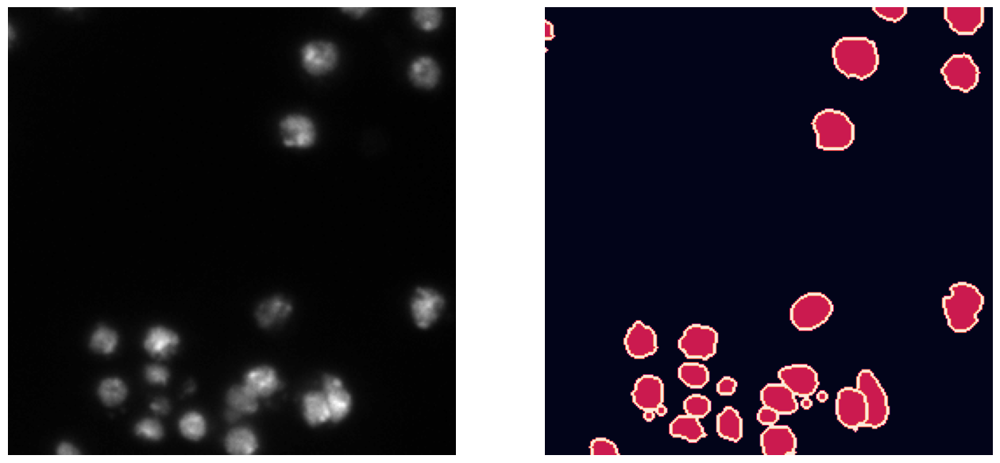

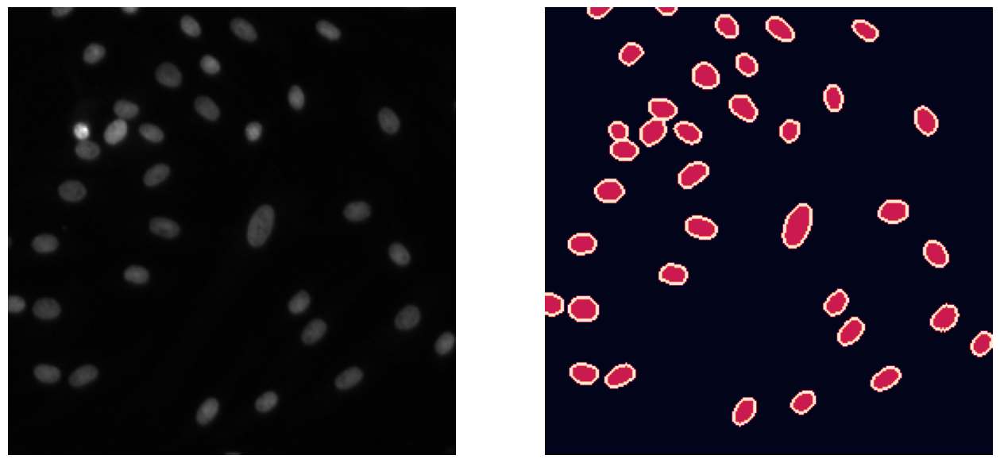

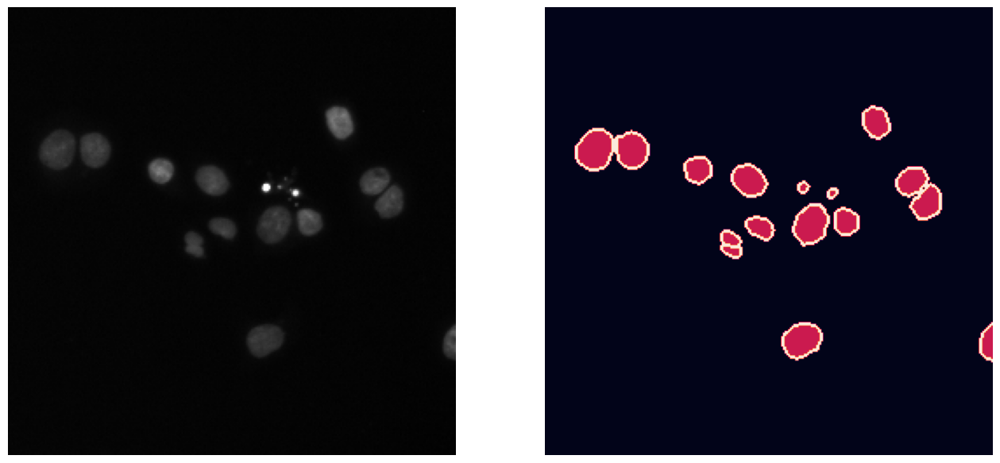

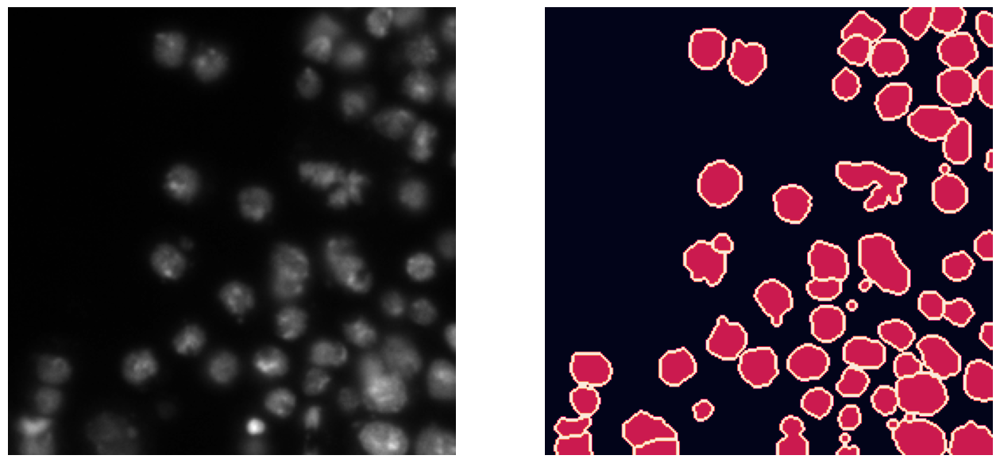

In [ ]:
# Visualize the new label transform and make sure it's correct
counter = 0
for im, target in train_dataset:
    if counter > 3:
        break

    fig, ax = plt.subplots(1, 2, figsize=(16, 16))

    ax[0].axis("off")
    ax[0].imshow(im[0], cmap="gray")

    ax[1].axis("off")
    ax[1].imshow(target)

    plt.show()
    counter += 1

In [ ]:
# TODO instantiate the new unet and loss function
model = UNet2(1, 3).to(device)
loss =nn.CrossEntropyLoss()

100%|██████████| 10/10 [04:53<00:00, 29.39s/it]


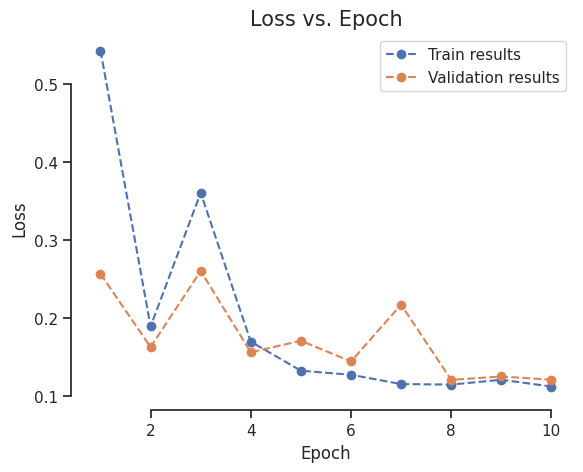

In [ ]:
# Train the new U-Net for 10 epochs
# (we don't use a metric here, since the target (with class labels 0, 1, 2) and prediction (one-hot encoding) have different representations
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = None
train_losses, _, val_losses, _ = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)

**Instance segmentation via watershed:**
We now want to use the predictions for background, foreground and boundary to better separate the nuclei than before using the following approach:
- Subtract the boundary prediction from the foreground prediction to separate touching nuclei from each other.
- Apply connected components to the result to get the "core" of the now separated nuclei.
- Grow these nucleus cores back to the full outlines.
    - For this step we will use the watershed algorithm, which segments images based on a height-map and markers.
    - The markers define the core of regions and they are grown by this algorithm until two markers meet at the highest point between them (defined by the heightmap).
- We will restrict the watershed to the foreground, so that nuclei don't spill over into the background.

**Let's visualize these steps to better understand them:**
- We are given the foreground and boundary predictions from the model:

![image.png](attachment:cd87dcaa-19f5-4e15-80bc-939ed7cca40d.png) ![image.png](attachment:982ed236-205b-4228-8635-90674d7cfd5d.png)

- Subtract the boundaries from the foreground predictions (left image), threshold the result (not shown) and apply connected components to generate the markers (right image):

![image.png](attachment:bee5ebe6-8a0c-4fb6-8383-723256847046.png)

- This provides us with all three inputs for the watershed:
    - The boundary predictions from the network can be used as heightmap (because they separate the nuclei) (*left image*)
    - The markers that we have just computed (*middle image*)
    - The thresholded foreground predictions, which we use as mask for the watershed (*right image*)

![image.png](attachment:dbce9721-b46a-4019-a3e9-90de55b0168d.png) ![image.png](attachment:4be40e32-d4ce-4bde-9e1d-831a79ac8128.png) ![image.png](attachment:49b36cc0-35eb-46f5-9e0b-c26270415110.png)

**Implementing the watershed:**
You can use `skimage.segmentation.watershed` (already imported) for this.
Here's how to use it:

```python
from skimage.segmentation import watershed

boundaries = ...
markers = ...
mask = ...

segmentation = watershed(image=boundaries, markers=markers, mask=mask)
```

In [ ]:
# TODO implement the watershed approach described above.
def instance_segmentation(foreground_prediction, boundary_prediction, threshold=0.5):
    diff_foreground_boundary = foreground_prediction - boundary_prediction
    mask = np.where(diff_foreground_boundary> threshold, 1,0)
    markers = label(mask, connectivity=2)

    segmentation = watershed(image=-foreground_prediction, markers=markers, mask=mask)
    return segmentation

threshold: 0.2


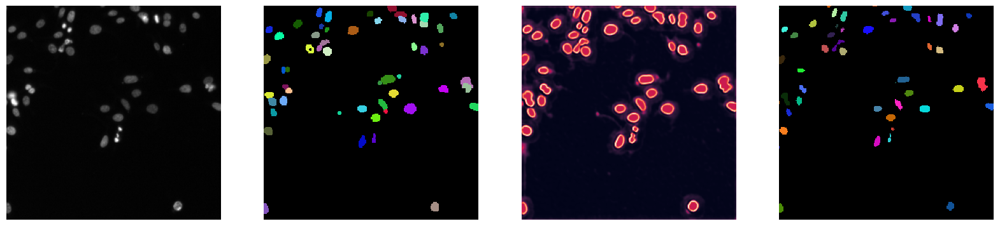

threshold: 0.3


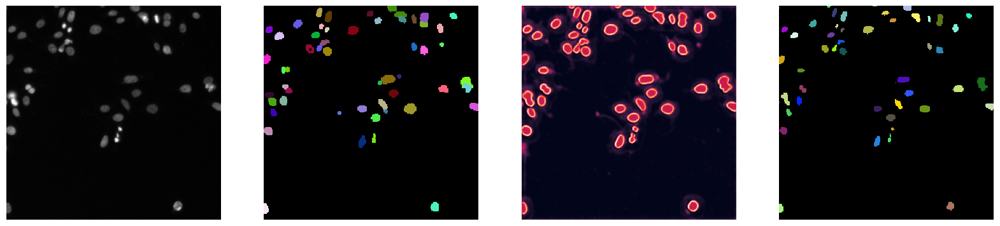

threshold: 0.4


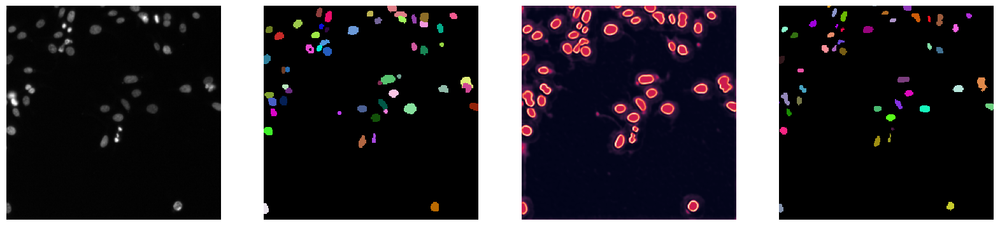

threshold: 0.5


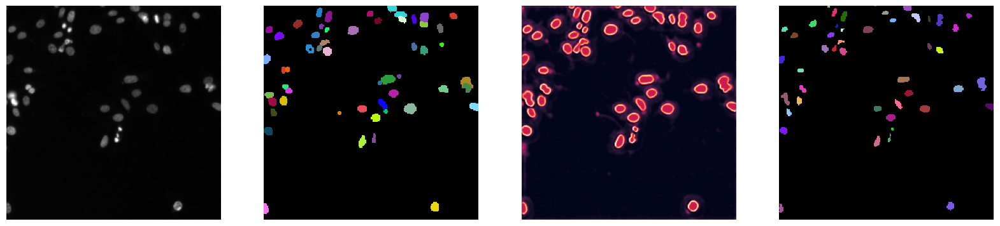

threshold: 0.7


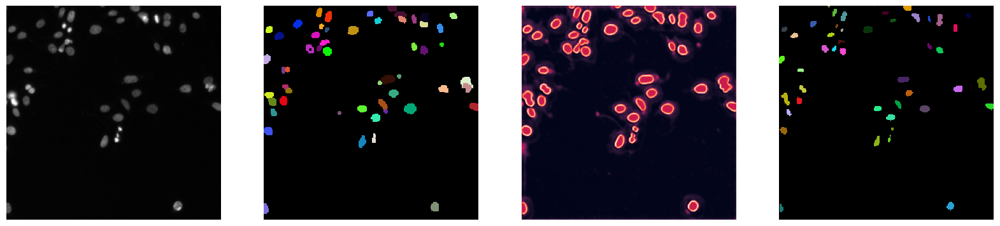

In [ ]:
# TODO Check the prediction results and instance segmentation for a few images
# Make sure your instance segmentation implementation is correct
# HINT: You need to apply a softmax to the network predictions
for threshold in [0.2, 0.3, 0.4, 0.5,0.7]:
    print("threshold:", threshold)

    counter = 1
    with torch.no_grad():
        for im, mask in zip(test_images, test_masks):
            if counter > 1:
                break
            # predict with the model and apply sigmoid to map the prediction to the range [0, 1]
            pred = model(torch.from_numpy(im[None, None]).to(device))
            pred = nn.Softmax(dim=1)(pred).cpu().numpy().squeeze()
            # get tbe nucleus instance segmentation by applying connected components to the binarized prediction
            sec = instance_segmentation(pred[1], pred[2],threshold)
            fig, ax = plt.subplots(1, 4, figsize=(20, 20))
            ax[0].axis("off")
            ax[0].imshow(im, cmap="gray")
            ax[1].axis("off")
            ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
            ax[2].axis("off")
            ax[2].imshow(pred[0]*0+pred[1]*1+pred[2]*2)
            ax[3].axis("off")
            ax[3].imshow(sec, cmap=get_random_colors(sec), interpolation="nearest")
            plt.show()
            counter += 1

In [ ]:
# TODO Use the validation set to find a good value for the 'threshold' parameter in the instance_segmentation function
best_threshold = 0.4

In [ ]:
# Compute the average f1 score of all the test images
f1s = []
model.eval()
with torch.no_grad():
    for im, mask in tqdm.tqdm(zip(test_images, test_masks), total=len(test_images)):
        if any(sh % 16 != 0 for sh in im.shape):
            crop = tuple(slice(0, -(sh%16)) for sh in im.shape)
            im = im[crop]
            mask = mask[crop]

        input_ = torch.from_numpy(im[None, None]).to(device)
        pred = model(input_)
        pred = torch.softmax(pred, dim=1).cpu().numpy().squeeze()

        assert pred.shape[0] == 3
        nuclei = instance_segmentation(pred[1], pred[2], best_threshold)

        f1s.append(f1_score(nuclei, mask))

print()
print("Mean f1 score:", np.mean(f1s))

100%|██████████| 50/50 [00:02<00:00, 16.74it/s]


Mean f1 score: 0.7185576718814088


**QUESTIONS**:
- Did training with the boundaries and using them in the instance segmentation improve the results?
- Can you think of ways to improve the loss function for this learning task?

**Answer**

* No, training with boundaries did not improve the results and may have worsened the performance. Here, we get an f1_score of 0.71 and with boundaries we only get a f1_score of 0.61

* Using a loss function that handles class imbalance better, such as Dice Loss or Focal Loss, could improve the results. Since some of the clusters, which are close to each other, can be treated as one cluster with a shared boundary the CrossEntropyLoss tends to classify them as one cluster since the number of points in the  boundary class is lower than in the other two classes. So the model gets a better loss by not choosing the boundary class. Hence we should use a loss function which don't account for only a singal point.

## Use the dice coefficient as loss function
Since our target is quite unbalanced (in particular the boundary channel), it is beneficial to use a loss function that is robust against class imbalance. In this part of the exercise we will use the Dice coefficient as loss. We have already used it as a metric before.

Note that we do not need to predict a channel for background when using the dice coefficient as a loss (unlike with Cross Entropy).

In [ ]:
# TODO implement a loss function based on the dice coefficient
# HINT: the dice coefficient is in range [0, 1] and higher values correspond to a better result
# Loss functions are minimized, so lower values should correspond to a better result
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1e-5):

        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = nn.Softmax(dim=1)(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

In [ ]:
train_dataset = NucleiDataset(
    train_images, train_masks, mask_transform=label_transform2
)
val_dataset = NucleiDataset(
    val_images, val_masks, mask_transform=label_transform2
)

100%|██████████| 10/10 [03:17<00:00, 19.72s/it]


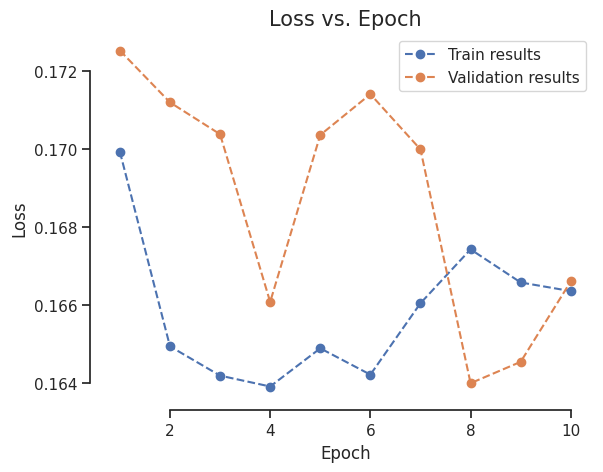

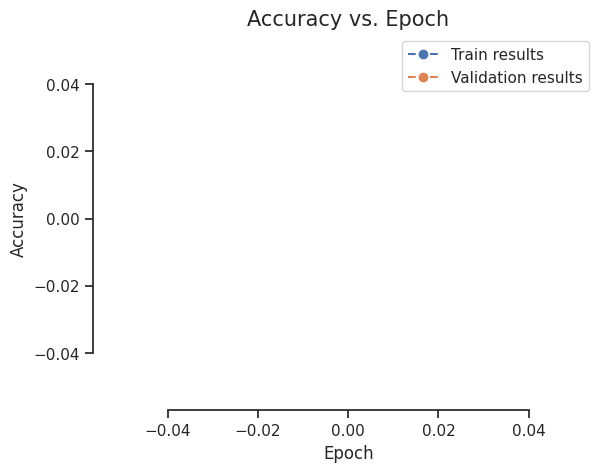

In [ ]:
# TODO Implement and compare with different loss function variations
# TODO implement and compare with different loss function variations
model = UNet(in_channels=1, out_channels=3).to(device)
loss = DiceLoss()
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = None
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

threshold: 0.1


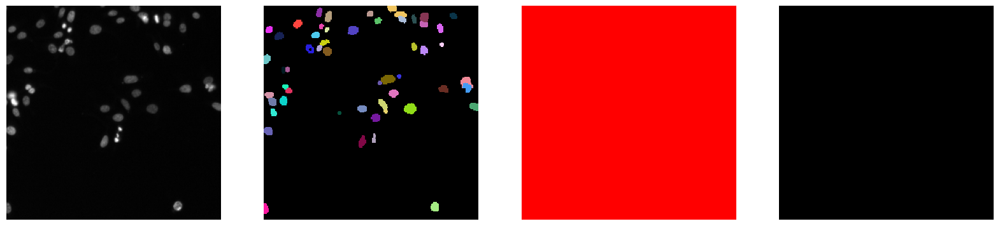

threshold: 0.25


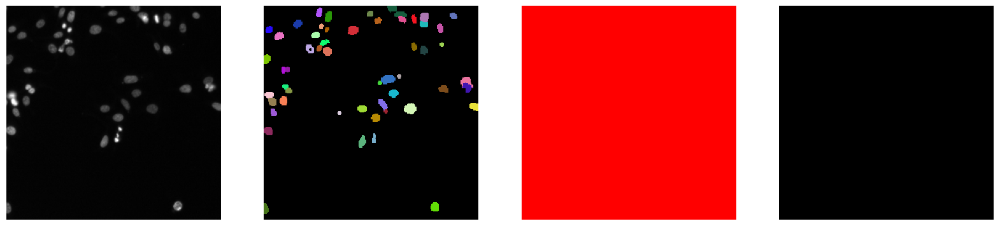

threshold: 0.5


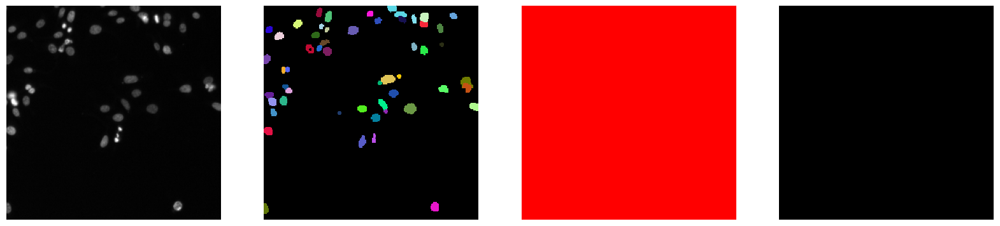

threshold: 0.75


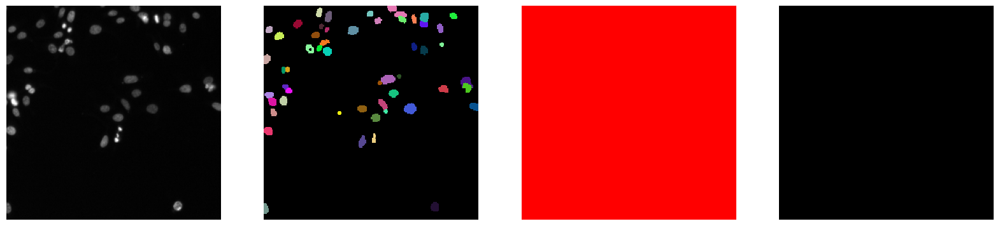

threshold: 0.95


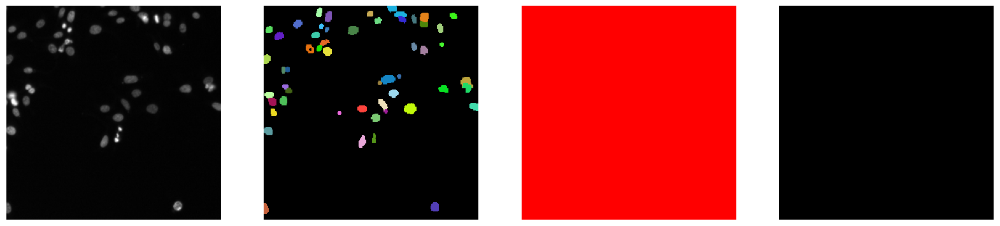

In [ ]:
#transpose((2, 0, 1))

for threshold in [0.1, 0.25, 0.5, 0.75,0.95]:
    print("threshold:", threshold)

    counter = 1
    with torch.no_grad():
        for im, mask in zip(test_images, test_masks):
            if counter > 1:
                break
            # predict with the model and apply sigmoid to map the prediction to the range [0, 1]
            pred = model(torch.from_numpy(im[None, None]).to(device))
            pred = nn.Sigmoid()(pred).cpu().numpy().squeeze()
            #print(pred)
            # get tbe nucleus instance segmentation by applying connected components to the binarized prediction
            sec = instance_segmentation(pred[1], pred[2],threshold)
            fig, ax = plt.subplots(1, 4, figsize=(20, 20))
            ax[0].axis("off")
            ax[0].imshow(im, cmap="gray")
            ax[1].axis("off")
            ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
            ax[2].axis("off")
            ax[2].imshow(pred.T)
            ax[3].axis("off")
            ax[3].imshow(sec, cmap=get_random_colors(sec), interpolation="nearest")
            plt.show()
            counter += 1

**QUESTIONS**:
- Did training with dice loss improve the results? Comment on it!

**Answers**
based on the plots training with the dice loss seams not working.

## Try variations of the UNet architecture (*Optional*)
- add BatchNorm
- replace TransposedConvs with bilinear upsampling and 1x1 convs
- use residual blocks instead of the normal convolutional blocks

In [ ]:
# TODO (Optional) Implement and compare u-net architecture variations

## Train with data augmentation (*Optional*)
- rotations & flips
- noise augmentations (add gaussian noise and/or poisson noise)
- crop and resize

Hint: use the `image_transform` (noise augmentations) and `transform` (geometrical augmentations) argument of the `NucleiDataset`

In [ ]:
# TODO (Optional) implement data augmentations and compare with training without augmentations

# Denoising with Noise2Noise
Here, we implement [Noise2Noise](https://arxiv.org/abs/1803.04189), which is a method to learn image denoising **without** ground-truth, by using a different noisy image as target. Note that we are re-using the same architecture as before, which is a bit different from the one used in the paper.
In order to evaluate the performance of segmentation and denoising, different metrics are used. For denoising, a PSNR of ~30 dB or higher indicates high-quality results for near noise-free RGB images.

## Data Preparation
We use the [VSDR dataset](https://cv.snu.ac.kr/research/VDSR), which contains 'clean' (i.e. without noise) natural images.

In [ ]:
# Download the VSDR data
!conda install -y gdown
!gdown --id 1hNB5_MkxutrKLa1g35tSLCiq1J5xxH9F --folder

os.makedirs("/kaggle/working/dlforcv-ex4", exist_ok=True)

!unzip "/kaggle/working/VDSR/train_data.zip" -d "dlforcv-ex4/vsdr_train"
!unzip "/kaggle/working/VDSR/test_data.zip" -d "dlforcv-ex4/vsdr_test"

/bin/bash: line 1: conda: command not found
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Retrieving folder contents
Processing file 1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X test_data.zip
Processing file 1jZMi_Q4uambklnyjMUcZFotb3_K9EKcX train_data.zip
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X
From (redirected): https://drive.google.com/uc?id=1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X&confirm=t&uuid=d6db793b-4036-469b-9969-5d2f81c42eb7
To: /content/VDSR/test_data.zip
100% 63.0M/63.0M [00:01<00:00, 59.1MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1jZMi_Q4uambklnyjMUcZFotb3_K9EKcX
From (redirected): https://drive.google.com/uc?id=1jZMi_Q4uambklnyjMUcZ

In [ ]:
# Setting paths for the training and testing data
vsdr_train = "/kaggle/working/dlforcv-ex4/vsdr_train/"
vsdr_test = "/kaggle/working/dlforcv-ex4/vsdr_test/"

In [ ]:
# download the VSDR data
#google colab
!conda install -y gdown
!gdown --id 1hNB5_MkxutrKLa1g35tSLCiq1J5xxH9F --folder

os.makedirs("dlforcv-ex4", exist_ok=True)

!unzip "VDSR/train_data.zip" -d "dlforcv-ex4/vsdr_train"
!unzip "VDSR/test_data.zip" -d "dlforcv-ex4/vsdr_test"

/bin/bash: line 1: conda: command not found
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Retrieving folder contents
Processing file 1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X test_data.zip
Processing file 1jZMi_Q4uambklnyjMUcZFotb3_K9EKcX train_data.zip
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X
From (redirected): https://drive.google.com/uc?id=1O5TcV-srsncaLrQck2G8yo5cNDvQpg9X&confirm=t&uuid=d8aea4f8-376a-42e2-a303-2a1fa5b7e9ed
To: /content/VDSR/test_data.zip
100% 63.0M/63.0M [00:00<00:00, 127MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1jZMi_Q4uambklnyjMUcZFotb3_K9EKcX
From (redirected): https://drive.google.com/uc?id=1jZMi_Q4uambklnyjMUcZF

In [ ]:
# setting paths for the training and testing data
#google colab
vsdr_train = "dlforcv-ex4/vsdr_train/"
vsdr_test = "dlforcv-ex4/vsdr_test/"

In [ ]:
# Check the unique image sizes in the training data
image_exts = (".jpeg", ".jpg", ".png", ".bmp")
all_image_paths = [
    p for p in Path(vsdr_test).glob("**/*") if p.suffix.lower() in image_exts
]

shapes = []
for p in all_image_paths:
    shapes.append(imageio.imread(p).shape)

unique_shapes = list(set(shapes))
print(unique_shapes)

[(672, 1024, 3), (768, 1024, 3), (980, 1000, 3), (656, 529, 3), (681, 1024, 3), (656, 1024, 3), (1024, 768, 3), (819, 1024, 3), (481, 321, 3), (769, 1024, 3), (683, 1024, 3), (695, 1024, 3), (673, 1024, 3), (805, 1024, 3), (344, 228, 3), (827, 1200, 3), (512, 512), (362, 500, 3), (1200, 798, 3), (512, 768, 3), (680, 1024, 3), (1024, 1005, 3), (963, 1280, 3), (288, 352, 3), (1024, 567, 3), (766, 1024, 3), (732, 1024, 3), (682, 1024, 3), (1037, 778, 3), (692, 1024, 3), (676, 1024, 3), (727, 1024, 3), (276, 276, 3), (864, 1024, 3), (288, 288, 3), (835, 1024, 3), (694, 1024, 3), (512, 512, 3), (616, 1024, 3), (280, 280, 3), (576, 1024, 3), (1024, 692, 3), (1024, 1024, 3), (678, 1024, 3), (773, 1024, 3), (1024, 683, 3), (644, 1024, 3), (1024, 685, 3), (797, 1024, 3), (256, 256, 3), (689, 1024, 3), (765, 1024, 3), (480, 500, 3), (391, 586, 3), (737, 1024, 3), (1024, 742, 3), (321, 481, 3), (660, 1024, 3), (576, 720, 3), (665, 1024, 3), (1024, 700, 3), (575, 1024, 3), (361, 250, 3)]


In [ ]:
# vsdr dataset that can deal with all the different data sizes in the training and test data
class VsdrDataset(Dataset):
    def __init__(self, root_dir, noise_transform):
        image_exts = (".jpeg", ".jpg", ".png", ".bmp")
        self.image_paths = [
            p for p in Path(root_dir).glob("**/*") if p.suffix.lower() in image_exts
        ]
        self.noise_transform = noise_transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        im = np.array(imageio.imread(self.image_paths[index]))
        if im.ndim == 2:
            im = np.concatenate([im[..., None]] * 3, axis=2)

        if im.shape[-1] == 1:
            im = np.concatenate([im] * 3, axis=2)

        target_shape = (256, 256)

        # First, pad the images if they are smaller than the target crop shape
        if any(sh < tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            padding = tuple((0, tsh - sh if sh < tsh else 0) for sh, tsh in zip(im.shape[:-1], target_shape))
            padding = padding + ((0, 0),)
            im = np.pad(im, padding, mode="reflect")

        # Then crop tham if they are too large
        if any(sh > tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            crop_start = [np.random.randint(0, sh - tsh) if sh != tsh else 0 for sh, tsh in zip(im.shape[:-1], target_shape)]
            crop = tuple(slice(cs, cs + tsh) for cs, tsh in zip(crop_start, target_shape))
            im = im[crop]

        assert im.shape == (256, 256, 3), f"{im.shape}"

        # Normalize the image to range [0, 1] (per channel)
        im = im.astype("float32")
        im -= im.min(axis=(0, 1), keepdims=True)
        im /= im.max(axis=(0, 1), keepdims=True)

        # Bring image in range [-1, 1]
        im = 2 * im - 1

        # Transform to channel first order
        im = im.transpose((2, 0, 1))

        # Apply the noise transformation
        return self.noise_transform(im)

In [ ]:
# Go from range [-1, 1] to [0, 255] and uint8
# and go to channel last order
def to_display(im):
    im = (((im + 1) / 2) * 255).astype("uint8")
    return im.transpose((1, 2, 0))

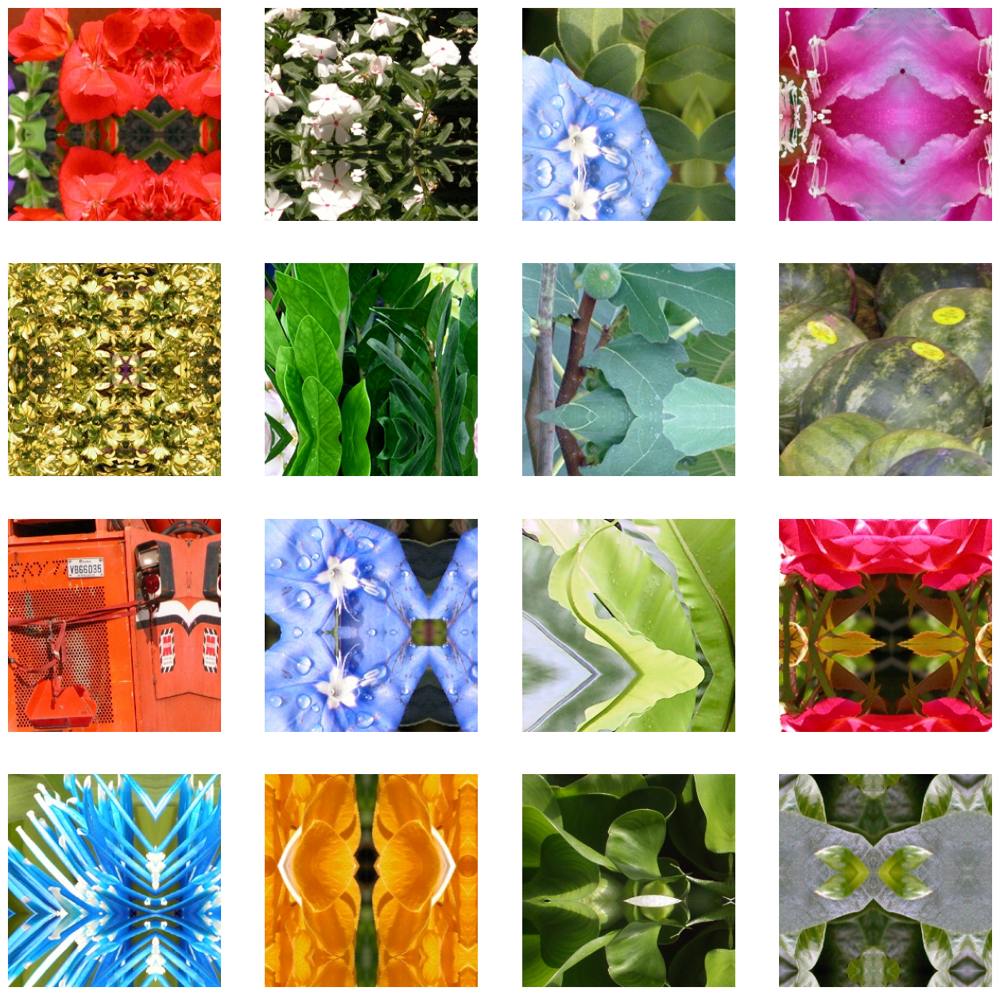

In [ ]:
# Sample a few images
check_dataset = VsdrDataset(vsdr_train, lambda x: x)
fig, ax = plt.subplots(4, 4, figsize=(16, 16))
for ii in range(16):
    im = check_dataset[ii]
    ax[ii % 4, ii // 4].axis("off")
    ax[ii % 4, ii // 4].imshow(to_display(im))

plt.show()

## Train a network with clean targets
As the first baseline, we will train a network with clean target data (i.e. without noise added to it).

In [ ]:
# Instatiate the model and loss function (Mean Squared Error)
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [ ]:
# We will use the PSNR (peak signal to noise ratio) as metric to evaluate the predictions.
# You can read up on it and the implementation we are using here:
# https://www.ni.com/en-us/innovations/white-papers/11/peak-signal-to-noise-ratio-as-an-image-quality-metric.html
# (the higher the PSNR, the better)
def to_uint8(im):
    return torch.clamp((im + 0.5) * 255.0 + 0.5, 0, 255).type(torch.uint8)


class PSNR(nn.Module):
    def __call__(self, x, y):
        x, y = to_uint8(x), to_uint8(y)
        x, y = x.detach().cpu().numpy(), y.detach().cpu().numpy()
        return peak_signal_noise_ratio(x, y)

**QUESTION**:
- What does the PSNR metric measure?
- Why is it used instead of 'just' computing the pixel wise error (MSE)?

**Answer**
* PSNR measures the peak signal-to-noise ratio between two images, indicating the quality of a compressed or reconstructed image. Higher PSNR values indicate better quality.

*  The MSE represents the cumulative squared error between the compressed and the original image, whereas PSNR represents a measure of the peak error. The MSE works well only if we want to generate a picture with the best pixel colors conformity with the ground truth picture. PSNR is better for assessing image quality, especially in compressed images. However, To use PSNR, we must transform all values of pixel representation to bit form. If we have 8-bit pixels, then the values of the pixel channels must be from 0 to 255. By the way, the red, green, blue or RGB color model fits best for the PSNR. PSNR shows a ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation.

In [ ]:
# TODO implement a function that adds additive gaussian noise to the input
# the var argument should correspond to the variance of the gaussian
# HINT: you can use the function `random_noise` from scikit-image.
def additive_gaussian_noise(x, var):
    return np.array(random_noise(x, mode='gaussian', mean=0, var=var, clip=False),dtype=np.float32)

In [ ]:
# TODO instantiate a vsdr dataset corresponding to the vsdr_train folder
# with a noise transformation that returns a corrupted image (as network input)
# and a clean image (as target)
# use a variance of 0.1
# split the dataset into a train (90% of the data) and validation dataset (10%)
# HINT: you can use torch.utils.data.random_split to split a torch dataset

vsdr_train_ds = VsdrDataset(vsdr_train,
                            noise_transform=lambda x: (additive_gaussian_noise(x, var=0.1), x))

train_size = int(0.9 * len(vsdr_train_ds))
val_size = len(vsdr_train_ds) - train_size
vsdr_train_ds, vsdr_val_ds = torch.utils.data.random_split(vsdr_train_ds, [train_size, val_size])

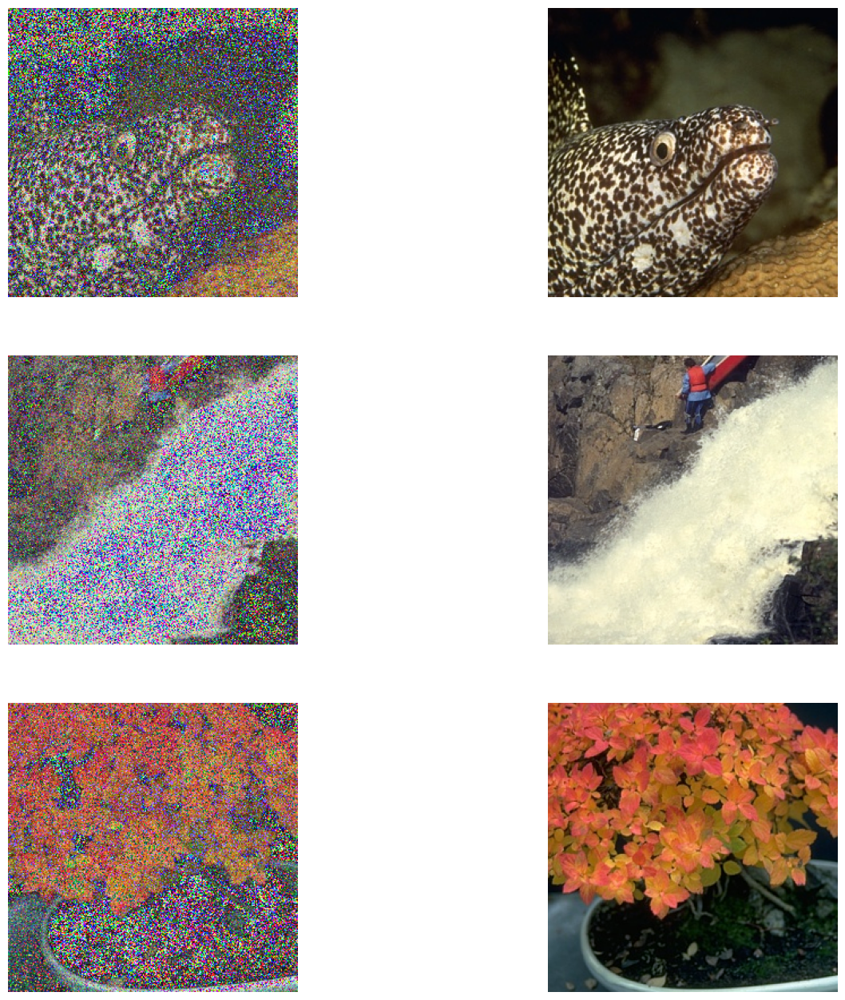

In [ ]:
# Sample a few images from the train dataset
fig, ax = plt.subplots(3, 2, figsize=(16, 16))
for ii in range(3):
    noisy, clean = vsdr_train_ds[ii]

    # Go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))

    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))

plt.show()

100%|██████████| 10/10 [03:18<00:00, 19.84s/it]


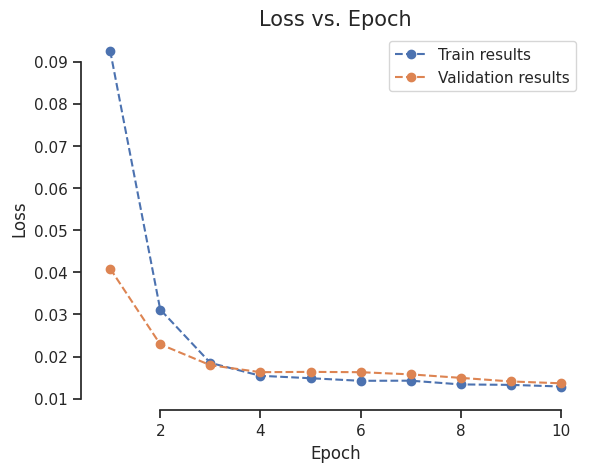

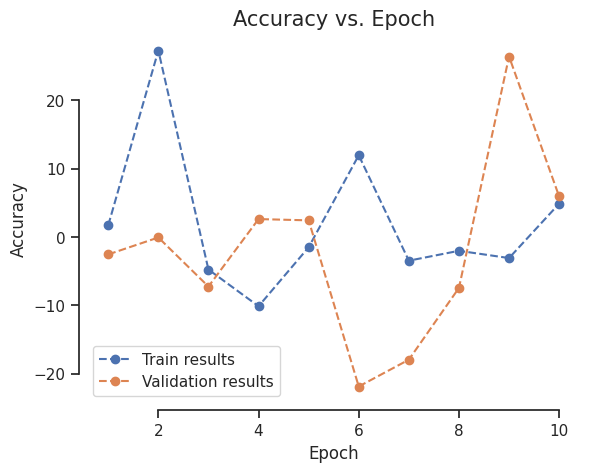

In [ ]:
# Train the denoising network
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
metric = PSNR()
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, dice_score, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

In [ ]:
# Create the test dataset
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x, var=0.1), x)
)

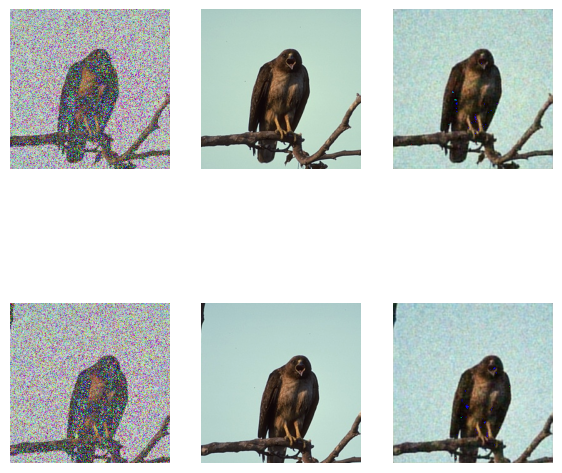

In [ ]:
# TODO Display some results on the test data
with torch.no_grad():
    i=0
    fig, ax = plt.subplots(2, 3, figsize=(7, 7))
    for ii in np.random.randint(len(vsdr_test_ds), size=2):

        noisy, clean = vsdr_test_ds[ii]
        input_ = torch.from_numpy(noisy[None]).to(device)
        pred = model(input_).cpu().numpy()
        # go back to uint8
        ax[i, 0].axis("off")
        ax[i, 0].imshow(to_display(noisy))
        ax[i, 1].axis("off")
        ax[i, 1].imshow(to_display(clean))
        ax[i, 2].axis("off")
        ax[i, 2].imshow(to_display(pred.squeeze()))
        i+=1
    plt.show()

## Train a network with noisy targets (Gaussian noise)
Now, we train a network from noisy inputs AND noisy targets. And compare its results to the previous denoising network learned on clean targets.

QUESTION:
- Why can the model learn denoising even though we also have a noisy target?

**Answer**

* Training with noisy data and noisy targets works because, on average, the model still learns the underlying clean signal. The gradient descent process averages out the noise over time, helping the model converge to a solution that is effective despite individual noisy samples. As long as the noise in the input and target share the same distribution, the model can still learn to denoise effectively.

In [ ]:
# Instantiate new model and loss
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [ ]:
# TODO create dataset with corrupted input and target
# use same variance as before (0.1)
vsdr_train_ds = VsdrDataset(vsdr_train,
    noise_transform=lambda x: (additive_gaussian_noise(x, var=0.1), additive_gaussian_noise(x, var=0.1))
)

# train_validation_splitting
train_size = int(0.9 * len(vsdr_train_ds))
val_size = len(vsdr_train_ds) - train_size
vsdr_train_ds, vsdr_val_ds = torch.utils.data.random_split(vsdr_train_ds, [train_size, val_size])

100%|██████████| 10/10 [03:38<00:00, 21.87s/it]


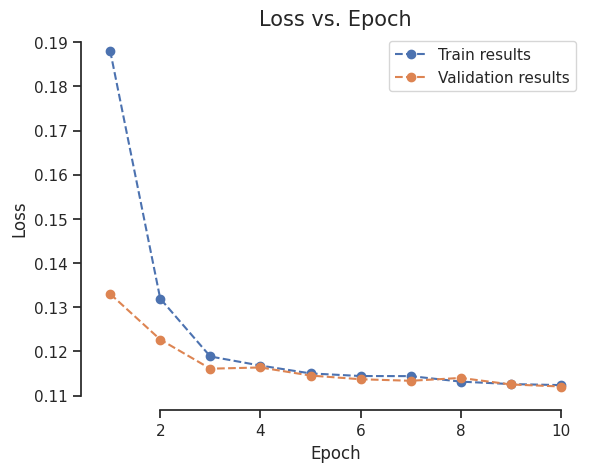

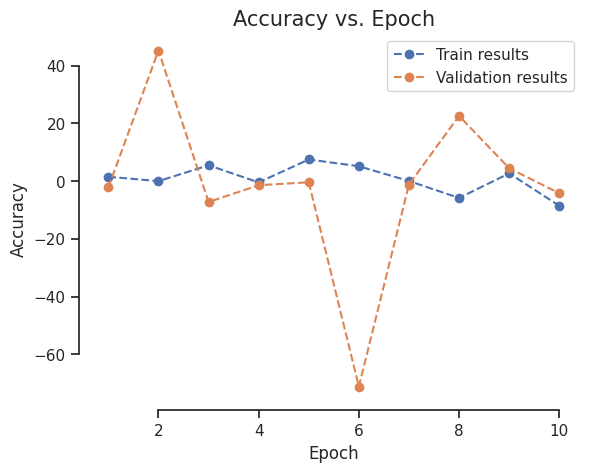

In [ ]:
# Train the model
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
metric = PSNR()
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, dice_score, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

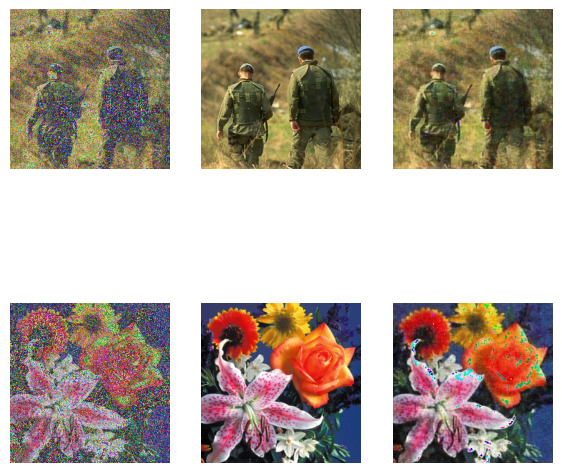

In [ ]:
# TODO show a few predictions for the test dataset
with torch.no_grad():
    i=0
    fig, ax = plt.subplots(2, 3, figsize=(7, 7))
    for ii in np.random.randint(len(vsdr_test_ds), size=2):

        noisy1, noisy2 = vsdr_test_ds[ii]
        input_ = torch.from_numpy(noisy1[None]).to(device)
        pred = model(input_).cpu().numpy()
        # go back to uint8
        ax[i, 0].axis("off")
        ax[i, 0].imshow(to_display(noisy1))
        ax[i, 1].axis("off")
        ax[i, 1].imshow(to_display(noisy2))
        ax[i, 2].axis("off")
        ax[i, 2].imshow(to_display(pred.squeeze()))
        i+=1
    plt.show()

In [ ]:
# TODO compute the PSNR for the whole test dataset

with torch.no_grad():
    psnr_all = 0
    for ii in np.random.randint(len(vsdr_test_ds), size=2):

        noisy1, noisy2 = vsdr_test_ds[ii]
        input_ = torch.from_numpy(noisy1[None]).to(device)
        pred = model(input_).cpu().numpy()
        loss = PSNR()
        psnr_all += loss(torch.from_numpy(noisy2), torch.from_numpy(pred[0]))
    print("PSNR for the whole test dataset:", psnr_all)

PSNR for the whole test dataset: 46.48086227508324


**QUESTIONS**:
- Compare the result between the network trained with clean targets and with noisy targets.

**Answer**
* The model trained on **clean targets** generally achieves better accuracy, as it learns directly from the true, noise-free data. Training with **noisy targets** can reduce accuracy because the model has to learn to handle both the input noise and the noise in the target, making the learning process less straightforward.

## Train a network with noisy targets (Poisson noise) (*Optional*)
Use poisson noise instead of gaussian noise and compare to both the network trained with clean target and the network with the target corrupted by gaussian noise.

In [ ]:
# TODO run training with poisson noise and compare with previous results
def additive_poisson_noise(x):
    return np.array(random_noise(x, mode='poisson', clip=False),dtype=np.float32)

In [ ]:
# instantiate new model and loss
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [ ]:
# TODO create dataset with corrupted input and target
# use same variance as before (0.1)
vsdr_train_ds = VsdrDataset(vsdr_train,
    noise_transform=lambda x: (additive_poisson_noise(x), additive_poisson_noise(x))
)

# train_validation_splitting
train_size = int(0.9 * len(vsdr_train_ds))
val_size = len(vsdr_train_ds) - train_size
vsdr_train_ds, vsdr_val_ds = torch.utils.data.random_split(vsdr_train_ds, [train_size, val_size])

100%|██████████| 10/10 [06:12<00:00, 37.23s/it]


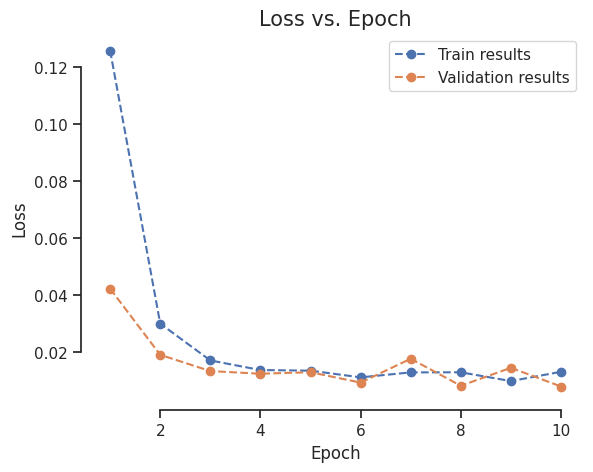

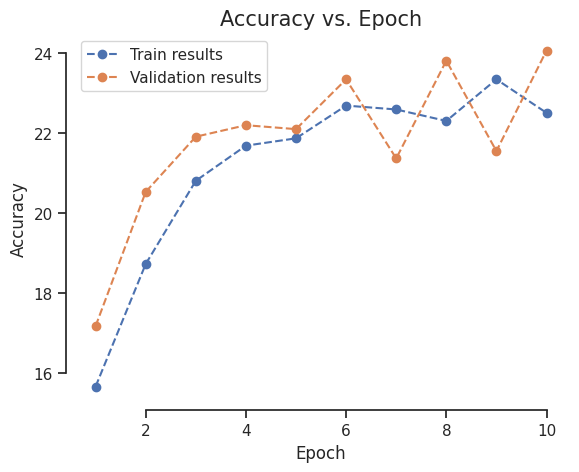

In [ ]:
# train the model
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

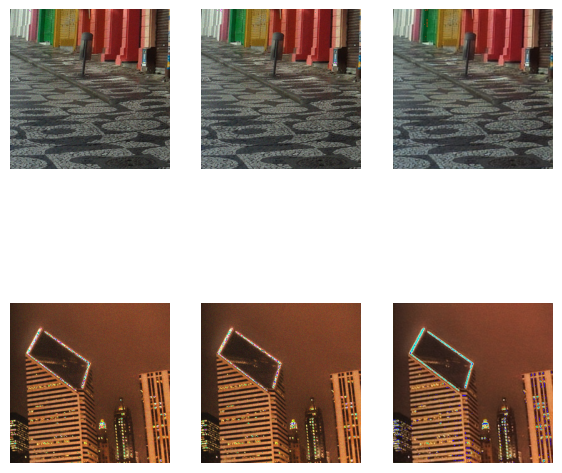

In [ ]:
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_poisson_noise(x), additive_poisson_noise(x))
)

with torch.no_grad():
    i=0
    fig, ax = plt.subplots(2, 3, figsize=(7, 7))
    for ii in np.random.randint(len(vsdr_test_ds), size=2):

        noisy1, noisy2 = vsdr_test_ds[ii]
        input_ = torch.from_numpy(noisy1[None]).to(device)
        pred = model(input_).cpu().numpy()
        # go back to uint8
        ax[i, 0].axis("off")
        ax[i, 0].imshow(to_display(noisy1))
        ax[i, 1].axis("off")
        ax[i, 1].imshow(to_display(noisy2))
        ax[i, 2].axis("off")
        ax[i, 2].imshow(to_display(pred.squeeze()))
        i+=1
    plt.show()